In [1]:
import os
import urllib
import yaml

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from pandas.api.types import CategoricalDtype
from IPython.display import display, HTML

mpl.rcParams["figure.dpi"] = 600
mpl.rcParams["font.family"] = "Arial"

pd.set_option("display.max_rows", 100)
pd.set_option("display.max_columns", None)
pd.set_option("float_format", "{:.2f}".format)

with open("./../config/column_types.yaml", "r", encoding="utf-8") as f:
    column_types = yaml.safe_load(f)

for col, t in column_types.items():
    column_types[col] = np.float32 if t == "numerical" else CategoricalDtype(**t)

with open("./../config/dataset_config.yaml", "r", encoding="utf-8") as f:
    dataset_config = yaml.safe_load(f)

with open("./../config/column_groups.yaml", "r", encoding="utf-8") as f:
    column_groups = yaml.safe_load(f)

dataset_path = "./../data/" + dataset_config["filename"]


**Initial Exploration**
=======================

Before attempting to build a machine learning model, we need to analyse the data.

# Introduction

The Ames Housing Data is an alternative to the Boston Housing data for sample data science and machine learning projects by [Dean De Cock](https://jse.amstat.org/v19n3/decock.pdf). It consists of 2930 observation and 82 columns, of which 23 nominal, 23 ordinal, 14 discrete, and 20 continuous. The data is tabular and highly heterogeneous, which makes it much closer to real datasets than the Boston Housing Data. The dataset can be downloaded as a tab-separated values text file from [here](https://jse.amstat.org/v19n3/decock/AmesHousing.txt), and a description of the data can be found [here](https://jse.amstat.org/v19n3/decock/DataDocumentation.txt). Given the complexity of this dataset, the analysis is split into several notebooks. In this notebook, a general exploration of the dataset is performed.

## Loading the data

It's a good practice to load all string columns as object, and all numerical columns as float, so that missing values are handled gracefully. We can also discard the `PID` column, since it is useful only for reviewing a certain row in the city website.

In [2]:
if not os.path.isfile(dataset_path):
    urllib.request.urlretrieve(dataset_config["url"], dataset_path)

ames_df = pd.read_csv(
    dataset_path,
    index_col="Order",
    sep="\t",
    dtype=column_types,
).drop(columns="PID")

ames_df.head()


,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
Order,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,020,RL,141.00,31770.00,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6.00,5.00,1960.00,1960.00,Hip,CompShg,BrkFace,Plywood,Stone,112.00,TA,TA,CBlock,TA,Gd,Gd,BLQ,639.00,Unf,0.00,441.00,1080.00,GasA,Fa,Y,SBrkr,1656.00,0.00,0.00,1656.00,1.00,0.00,1.00,0.00,3.00,1.00,TA,7.00,Typ,2.00,Gd,Attchd,1960.00,Fin,2.00,528.00,TA,TA,P,210.00,62.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,0.00,5.00,2010.00,WD,Normal,215000.00
2,020,RH,80.00,11622.00,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5.00,6.00,1961.00,1961.00,Gable,CompShg,VinylSd,VinylSd,NaN,0.00,TA,TA,CBlock,TA,TA,No,Rec,468.00,LwQ,144.00,270.00,882.00,GasA,TA,Y,SBrkr,896.00,0.00,0.00,896.00,0.00,0.00,1.00,0.00,2.00,1.00,TA,5.00,Typ,0.00,NaN,Attchd,1961.00,Unf,1.00,730.00,TA,TA,Y,140.00,0.00,0.00,0.00,120.00,0.00,NaN,MnPrv,NaN,0.00,6.00,2010.00,WD,Normal,105000.00
3,020,RL,81.00,14267.00,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6.00,6.00,1958.00,1958.00,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.00,TA,TA,CBlock,TA,TA,No,ALQ,923.00,Unf,0.00,406.00,1329.00,GasA,TA,Y,SBrkr,1329.00,0.00,0.00,1329.00,0.00,0.00,1.00,1.00,3.00,1.00,Gd,6.00,Typ,0.00,NaN,Attchd,1958.00,Unf,1.00,312.00,TA,TA,Y,393.00,36.00,0.00,0.00,0.00,0.00,NaN,NaN,Gar2,12500.00,6.00,2010.00,WD,Normal,172000.00
4,020,RL,93.00,11160.00,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,7.00,5.00,1968.00,1968.00,Hip,CompShg,BrkFace,BrkFace,NaN,0.00,Gd,TA,CBlock,TA,TA,No,ALQ,1065.00,Unf,0.00,1045.00,2110.00,GasA,Ex,Y,SBrkr,2110.00,0.00,0.00,2110.00,1.00,0.00,2.00,1.00,3.00,1.00,Ex,8.00,Typ,2.00,TA,Attchd,1968.00,Fin,2.00,522.00,TA,TA,Y,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,0.00,4.00,2010.00,WD,Normal,244000.00
5,060,RL,74.00,13830.00,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5.00,5.00,1997.00,1998.00,Gable,CompShg,VinylSd,VinylSd,NaN,0.00,TA,TA,PConc,Gd,TA,No,GLQ,791.00,Unf,0.00,137.00,928.00,GasA,Gd,Y,SBrkr,928.00,701.00,0.00,1629.00,0.00,0.00,2.00,1.00,3.00,1.00,TA,6.00,Typ,1.00,TA,Attchd,1997.00,Fin,2.00,482.00,TA,TA,Y,212.00,34.00,0.00,0.00,0.00,0.00,NaN,MnPrv,NaN,0.00,3.00,2010.00,WD,Normal,189900.00


## Distribution of target values

The target has a skewed distribution, indicating that a simple model such as linear regression is out of the question. We need to use at least a generalised linear model, with a kernel transformation for the target data.

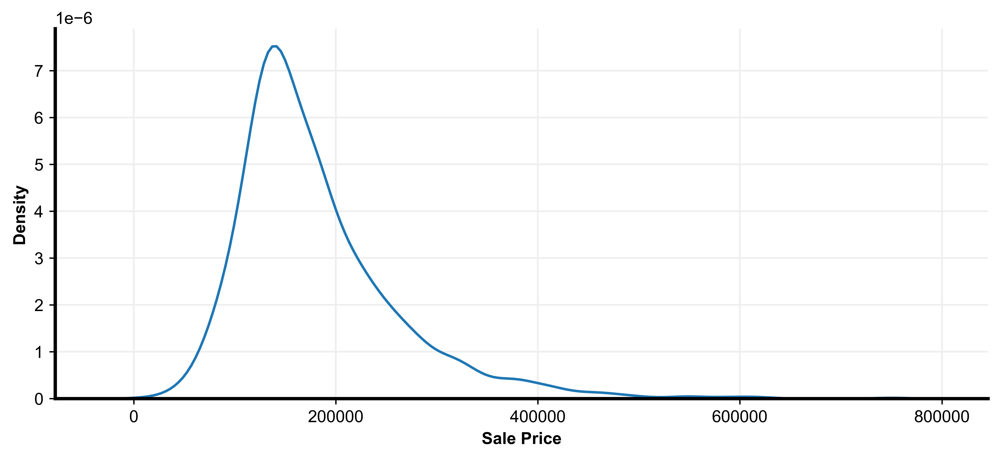

Kurtosis = 5.11


In [3]:
from scipy.stats import kurtosis

fig = plt.figure(figsize=(10, 4))
sns.kdeplot(ames_df, x="SalePrice", zorder=2)

ax = fig.gca()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set(lw=2)
ax.spines["left"].set(lw=2)
ax.set_xlabel("Sale Price", weight="bold")
ax.set_ylabel("Density", weight="bold")
ax.grid(which="major", axis="x", zorder=0, color="#EEEEEE", linewidth=1)
ax.grid(which="major", axis="y", zorder=0, color="#EEEEEE", linewidth=1)

plt.show()
print(f"Kurtosis = {kurtosis(ames_df['SalePrice']):.2f}")

## Missing values

There are a few columns where a large number of values are missing, namely `Lot Frontage`, `Alley`, `Mas Vnr Type`, `Fireplace Qu`, `Pool QC`, `Fence`, and `Misc Feature`. Very likely, dropping these columns will give us a better performance boost instead of trying to impute them. In some of the missing columns we can see a pattern, for example, `Bsmt Qual`, `Bsmt Cond`, `Bsmt Exposure`, `BsmtFin Type 1`, and `BsmtFin Type 2` have a very close or equal number of missing value. This is because `No Basement` is encoded as a missing value in these columns, and in houses where the basement is missing, therefore, all these columns are missing the value. Same reasoning for `Garage Type`, `Garage Yr Blt`, `Garage Finish`, `Garage Qual`, and `Garage Cond`.

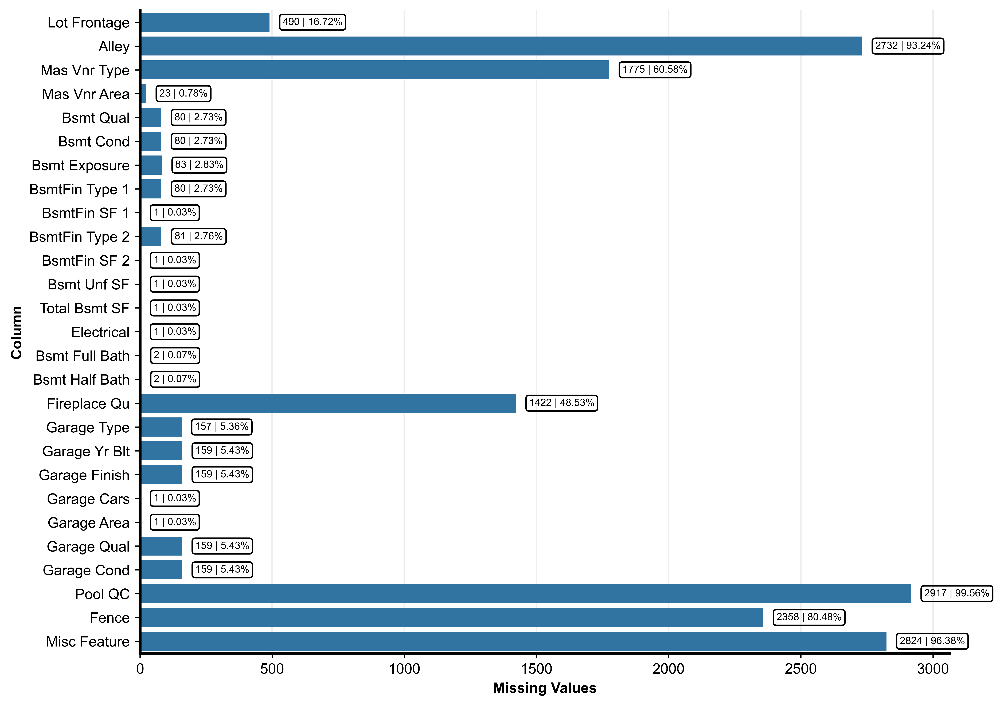

In [4]:
fig = plt.figure(figsize=(10, 8))

missing_count = ames_df.isna().sum()
missing_count = missing_count[missing_count > 0]

sns.barplot(missing_count, orient="h", zorder=2)

ax = plt.gca()

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set(lw=2)
ax.spines["left"].set(lw=2)
ax.set_xlabel("Missing Values", weight="bold")
ax.set_ylabel("Column", weight="bold")

ax.grid(which="major", axis="x", zorder=0, color="#EEEEEE", linewidth=1)

for p in ax.patches:
    value = f"{p.get_width():.0f} | {(p.get_width() / ames_df.shape[0]):,.2%}"
    x = p.get_x() + p.get_width() + 50
    y = p.get_y() + p.get_height() / 2
    ax.text(
        x,
        y,
        value,
        ha="left",
        va="center",
        fontsize=7,
        bbox=dict(facecolor="none", edgecolor="black", boxstyle="round", linewidth=1),
    )

### Correlation of missing values in basement columns

As we can see in the figure, the correlation between missing values in `Bsmt Qual`, `Bsmt Cond`, `Bsmt Exposure`, `BsmtFin Type 1`, and `BsmtFin Type 2` is almost perfect, confirming our speculation. The other columns that have 1 or 2 missing values also perfectly correlate with each other.

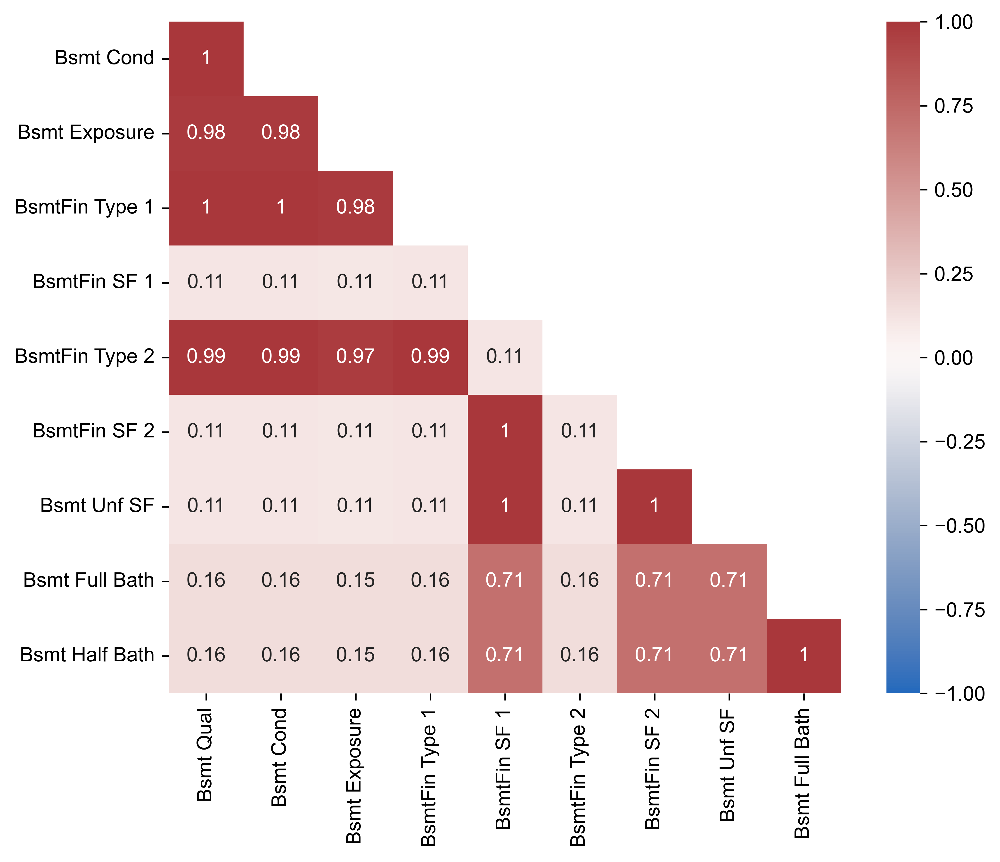

Overlapping sets: 
['BsmtFin SF 2', 'Bsmt Unf SF', 'BsmtFin SF 1']
['Bsmt Half Bath', 'Bsmt Full Bath']
['BsmtFin Type 1', 'Bsmt Exposure', 'BsmtFin Type 2', 'Bsmt Cond', 'Bsmt Qual']


In [5]:
bsmt_cols = ames_df.columns[ames_df.columns.str.startswith("Bsmt")]

corr = ames_df[bsmt_cols].isna().corr()

fig = plt.figure(figsize=(8, 6))

sns.heatmap(
    corr.iloc[1:, :-1],
    cmap="vlag",
    vmin=-1,
    vmax=1,
    mask=np.triu(np.ones(corr.shape[0] - 1), 1),
    square=True,
    annot=True,
)

plt.show()

sets = set()

for c in corr.columns:
    curr_s = corr[c]
    curr_s = curr_s[curr_s >= 0.8].drop(c)

    if not curr_s.empty:
        sets.add(frozenset(curr_s.index.to_list() + [c]))

print("Overlapping sets: ")

for s in sets:
    print(list(s))

### Correlation of missing values in garage columns

The same thing as the previous paragraph can be said about garage columns, confirming what we thought.

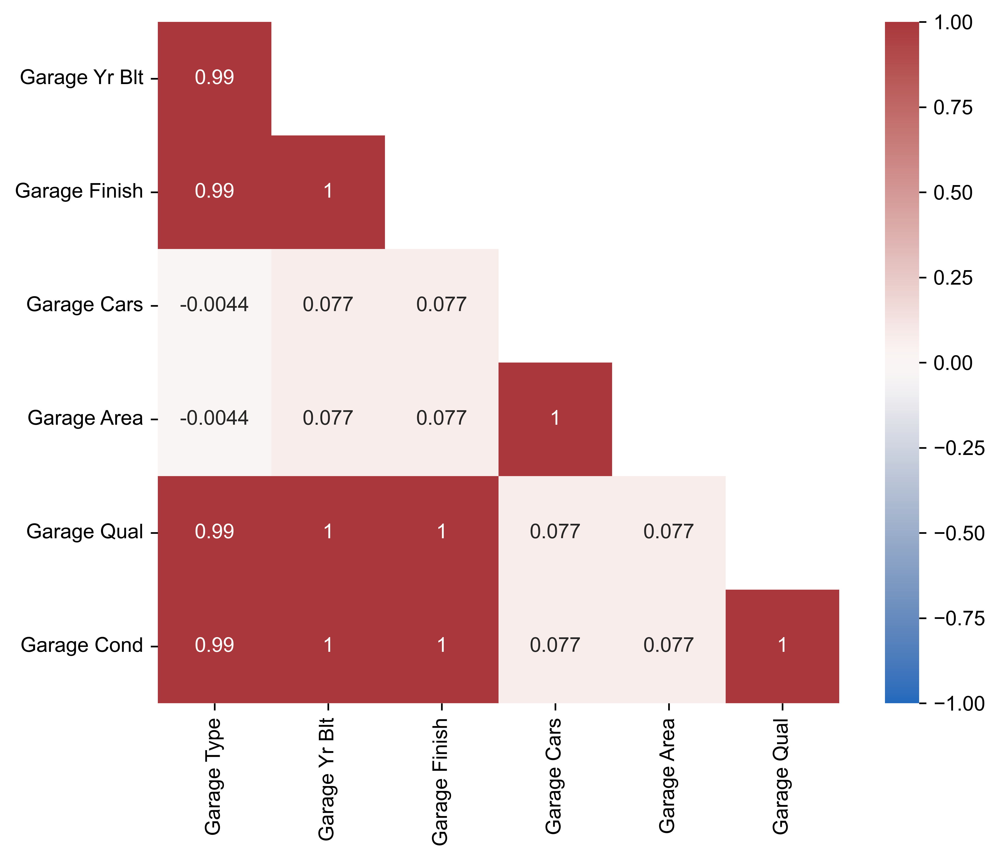

Overlapping sets: 
['Garage Qual', 'Garage Yr Blt', 'Garage Cond', 'Garage Finish', 'Garage Type']
['Garage Area', 'Garage Cars']


In [6]:
bsmt_cols = ames_df.columns[ames_df.columns.str.startswith("Garage")]

corr = ames_df[bsmt_cols].isna().corr()

fig = plt.figure(figsize=(8, 6))

sns.heatmap(
    corr.iloc[1:, :-1],
    cmap="vlag",
    vmin=-1,
    vmax=1,
    mask=np.triu(np.ones(corr.shape[0] - 1), 1),
    square=True,
    annot=True,
)

plt.show()

sets = set()

for c in corr.columns:
    curr_s = corr[c]
    curr_s = curr_s[curr_s >= 0.8].drop(c)

    if not curr_s.empty:
        sets.add(frozenset(curr_s.index.to_list() + [c]))

print("Overlapping sets: ")

for s in sets:
    print(list(s))

# Numerical Columns Analysis

Numerical columns are subdivided into two categories: continuous and discrete. Since we're planning to feed the data to a machine learning model, we should treat them all as continuous.

## Correlation analysis

Performing a correlation analysis, we can notice some columns that highly correlate with each other. It is likely that by leaving only one column of each multicollinear set, we can reduce the bias of the model. We can also notice that many columns have a very weak correlation with the target `SalePrice`.

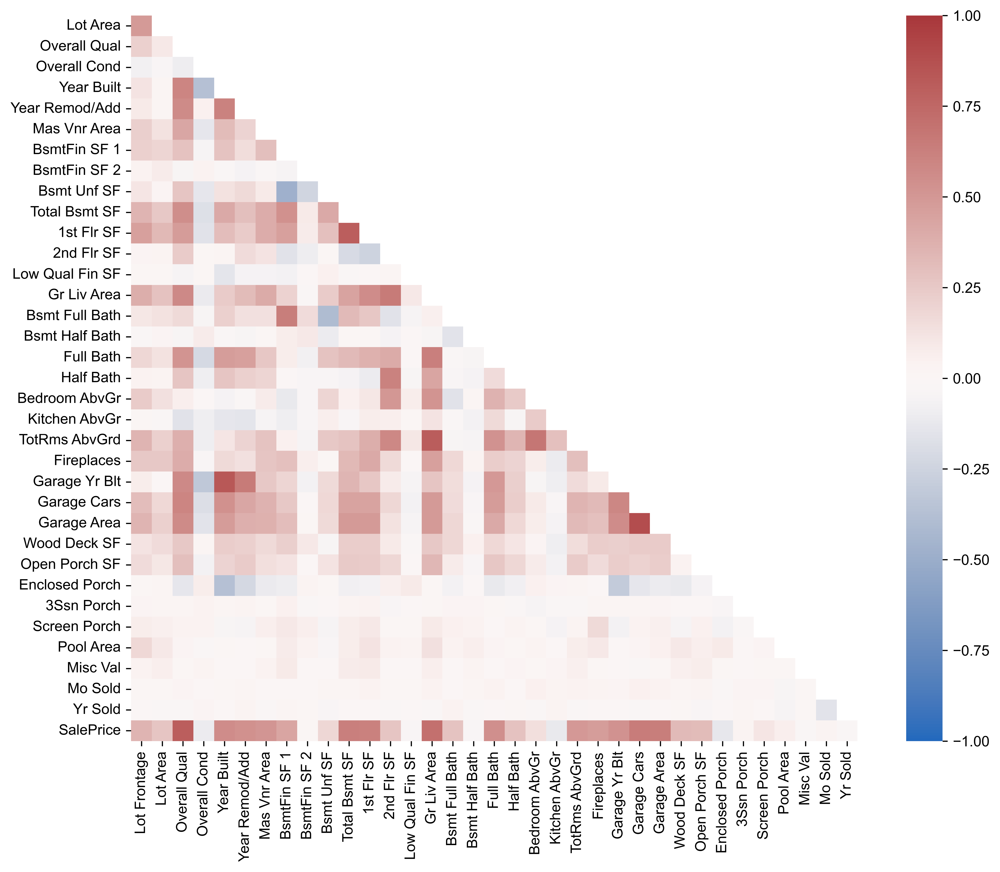

Multicollinear sets: 
['Year Built', 'Garage Yr Blt']
['1st Flr SF', 'Total Bsmt SF']
['Gr Liv Area', 'TotRms AbvGrd']
['Garage Area', 'Garage Cars']


In [7]:
corr = ames_df.select_dtypes("number").corr()

fig = plt.figure(figsize=(12, 9))

sns.heatmap(
    corr.iloc[1:, :-1],
    cmap="vlag",
    vmin=-1,
    vmax=1,
    mask=np.triu(np.ones(corr.shape[0] - 1), 1),
    square=True,
)

plt.show()

sets = set()

for c in corr.columns:
    curr_s = corr[c]
    curr_s = curr_s[curr_s >= 0.8].drop(c)

    if not curr_s.empty:
        sets.add(frozenset(curr_s.index.to_list() + [c]))

print("Multicollinear sets: ")

for s in sets:
    print(list(s))

### Scatterplots

We can also visualise the correlations between continuous columns and the target `SalePrice` with scatterplots. Looks like there are some columns that have a lot of values equal to 0, and might be problematic. We'll analyse this in detail during the distribution analysis.

In [8]:
selected_df = ames_df[column_groups['continuous']]
selected_df = selected_df[sorted(selected_df.columns)]
row_size = 5

fig, axs = plt.subplots(
    -(selected_df.shape[1] // -row_size),
    row_size,
    figsize=(14, 10),
    sharey=True,
    constrained_layout=True,
)

for i, col in enumerate(selected_df):
    ax = axs[i // row_size, i % row_size]

    ax.scatter(ames_df[col], ames_df["SalePrice"], zorder=2, s=1)

    ax.set_title(col, weight="bold")
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set(lw=2)
    ax.spines["left"].set(lw=2)
    ax.grid(which="major", axis="x", zorder=0, color="#EEEEEE", linewidth=1)
    ax.grid(which="major", axis="y", zorder=0, color="#EEEEEE", linewidth=1)
    ax.set_ylim((0, max(ames_df["SalePrice"])))

    for tick in ax.get_xticklabels():
        tick.set_rotation(20)

i += 1

while i % row_size > 0:
    fig.delaxes(axs[i // row_size, i % row_size])
    i += 1

plt.show()

## Distribution analysis

To analyse the distribution of numerical columns, we need to differentiate between continuous columns and discrete columns. This is because discrete columns have a limited amount of values, similarly to ordinal columns.

### Continuous columns

From the KDE plot of the continuous columns, we can see that they're all highly skewed. Furthermore, many columns have most of the values equal to 0, and dropping them is likely to benefit our model.

In [9]:
selected_df = ames_df[column_groups['continuous']]
selected_df = selected_df[sorted(selected_df.columns)]
row_size = 5

fig, axs = plt.subplots(
    -(selected_df.shape[1] // -row_size),
    row_size,
    figsize=(14, 10),
    constrained_layout=True,
)

for i, col in enumerate(selected_df):
    ax = axs[i // row_size, i % row_size]

    sns.kdeplot(selected_df[col], zorder=2, ax=ax)

    ax.set_title(col, weight="bold")
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set(lw=2)
    ax.spines["left"].set(lw=2)
    ax.grid(which="major", axis="x", zorder=0, color="#EEEEEE", linewidth=1)
    ax.grid(which="major", axis="y", zorder=0, color="#EEEEEE", linewidth=1)

    for tick in ax.get_xticklabels():
        tick.set_rotation(20)

i += 1

while i % row_size > 0:
    fig.delaxes(axs[i // row_size, i % row_size])
    i += 1

plt.show()

print("Columns having more than 95% values equal to 0:")

for c in column_groups['continuous']:
    if sum(ames_df[c] == 0) / ames_df.shape[0] >= 0.95:
        print(f"- {c}")

Columns having more than 95% values equal to 0:
- Low Qual Fin SF
- 3Ssn Porch
- Pool Area
- Misc Val


## Discrete columns

Looks like also among the discrete columns there are some columns which can improve the performance if dropped.

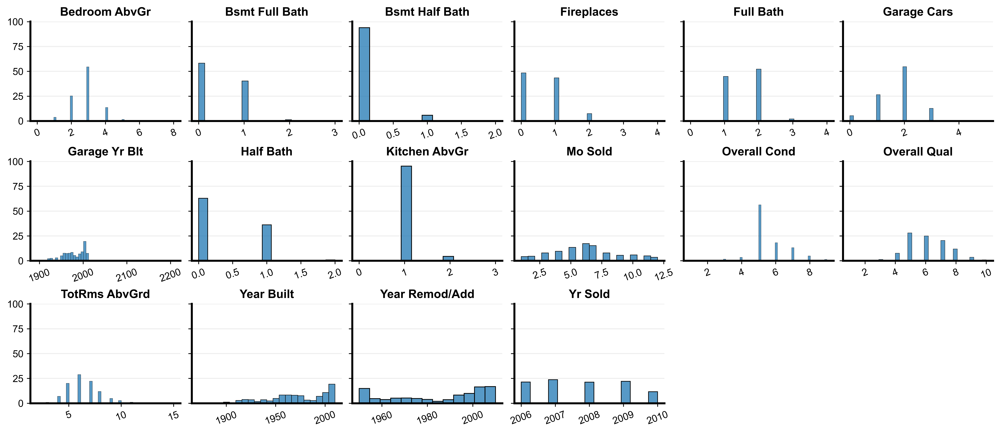

Columns having more than 90% values distributed in one value:
- Bsmt Half Bath
- Kitchen AbvGr


In [10]:
selected_df = ames_df[column_groups['discrete']]
selected_df = selected_df[sorted(selected_df.columns)]
row_size = 6

fig, axs = plt.subplots(
    -(selected_df.shape[1] // -row_size),
    row_size,
    figsize=(14, 6),
    sharey=True,
    constrained_layout=True,
)

for i, col in enumerate(selected_df):
    ax = axs[i // row_size, i % row_size]

    sns.histplot(selected_df[col], stat="percent", zorder=2, ax=ax)

    ax.set_title(col, weight="bold")
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set(lw=2)
    ax.spines["left"].set(lw=2)
    ax.grid(which="major", axis="y", zorder=0, color="#EEEEEE", linewidth=1)

    for tick in ax.get_xticklabels():
        tick.set_rotation(20)

i += 1

while i % row_size > 0:
    fig.delaxes(axs[i // row_size, i % row_size])
    i += 1

plt.show()

print("Columns having more than 90% values distributed in one value:")

for c in column_groups['discrete']:
    val_counts = ames_df[c].value_counts()
    val_percs = val_counts / sum(val_counts)

    if val_percs.iloc[0] >= 0.9:
        print(f"- {c}")

# Object Columns Analysis

Object columns are subdivided into two categories: nominal and ordinal.

## Nominal columns

As we can see in the figure, some nominal columns are problematic since the distribution is concentrated mostly in one value. It is likely that dropping these columns will give a performance boost to our machine learning model.

`Central Air` is an interesting column among the nominal ones. It contains only the values `Y` and `N`, so it actually represents a boolean value, and can be casted accordingly before feeding it to our model.

In [11]:
selected_df = ames_df[column_groups['nominal']]
selected_df = selected_df[sorted(selected_df.columns)]
row_size = 4

fig, axs = plt.subplots(
    -(selected_df.shape[1] // -row_size),
    row_size,
    figsize=(14, 14),
    sharey=True,
    constrained_layout=True,
)

for i, col in enumerate(selected_df):
    ax = axs[i // row_size, i % row_size]

    sns.histplot(selected_df[col], ax=ax, zorder=2, stat="percent")

    ax.set_title(col, weight="bold")
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set(lw=2)
    ax.spines["left"].set(lw=2)
    ax.grid(which="major", axis="y", zorder=0, color="#EEEEEE", linewidth=1)

    for tick in ax.get_xticklabels():
        tick.set_rotation(90)

i += 1

while i % row_size > 0:
    fig.delaxes(axs[i // row_size, i % row_size])
    i += 1

plt.show()

print("Columns having more than 96% values concentrated in one value:")

for c in column_groups['nominal']:
    val_counts = ames_df[c].value_counts()
    val_percs = val_counts / sum(val_counts)

    if val_percs.iloc[0] >= 0.95:
        print(f"- {c}")

Columns having more than 96% values concentrated in one value:
- Street
- Condition 2
- Roof Matl
- Heating


## Ordinal columns

Even though ordinal columns are encoded as strings in the dataset, the documentation provides the order with which they should be encoded. In this category there are also problematic columns that will likely improve the performance of the model when dropped.

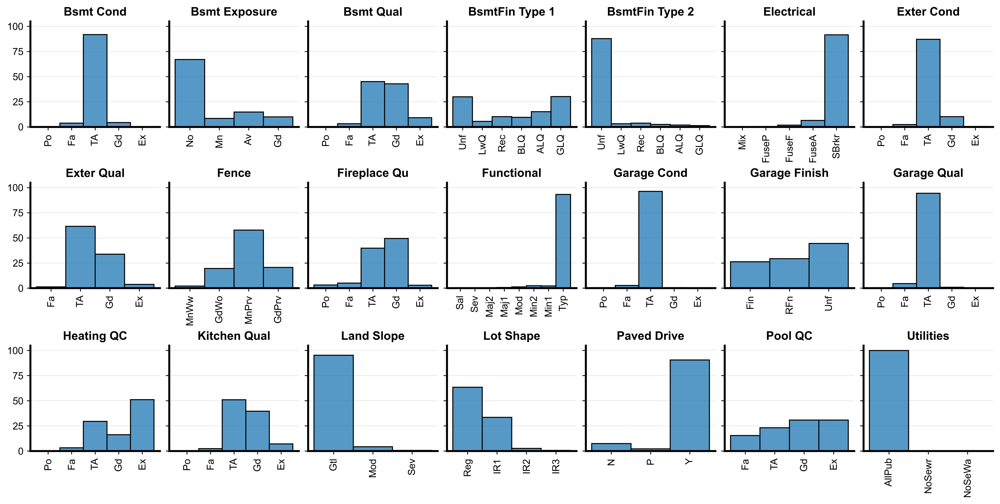

Columns having more than 95% values distributed in one value:
- Utilities
- Land Slope
- Garage Cond


In [12]:
selected_df = ames_df[column_groups['ordinal']]
selected_df = selected_df[sorted(selected_df.columns)]
row_size = 7

fig, axs = plt.subplots(
    -(selected_df.shape[1] // -row_size),
    row_size,
    figsize=(14, 7),
    sharey=True,
    constrained_layout=True,
)

for i, col in enumerate(selected_df):
    ax = axs[i // row_size, i % row_size]

    sns.histplot(selected_df[col], ax=ax, zorder=2, stat="percent")

    ax.set_title(col, weight="bold")
    ax.set_xlabel(None)
    ax.set_ylabel(None)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["bottom"].set(lw=2)
    ax.spines["left"].set(lw=2)
    ax.grid(which="major", axis="y", zorder=0, color="#EEEEEE", linewidth=1)

    for tick in ax.get_xticklabels():
        tick.set_rotation(90)

plt.show()

print("Columns having more than 95% values distributed in one value:")

for c in column_groups['ordinal']:
    val_counts = ames_df[c].value_counts()
    val_percs = val_counts / sum(val_counts)

    if val_percs.iloc[0] >= 0.95:
        print(f"- {c}")

### Encoding ordinal columns

If we encode ordinal columns following the ranking provided in the documentation, we can also do a correlation analysis between the encoded values, and also with the target value, extending the correlation analysis that we've already performed with the numerical columns:

In [13]:
ames_encoded_df = ames_df.copy()

qual_columns = [
    "Exter Qual",
    "Exter Cond",
    "Bsmt Qual",
    "Bsmt Cond",
    "Bsmt Exposure",
    "Heating QC",
    "Kitchen Qual",
    "Fireplace Qu",
    "Garage Qual",
    "Garage Cond",
    "Pool QC",
]
qual_dict = {
    "Ex": 5.0,
    "Gd": 4.0,
    "TA": 3.0,
    "Av": 3.0,
    "Mn": 2.0,
    "Fa": 2.0,
    "Po": 1.0,
    "NA": 0.0,
}
for c in qual_columns:
    ames_encoded_df[c] = (
        ames_encoded_df[c].map(qual_dict).astype(np.float32).fillna(0.0)
    )

bsmt_type_columns = ["BsmtFin Type 1", "BsmtFin Type 2"]
bsmt_type_dict = {
    "GLQ": 6.0,
    "ALQ": 5.0,
    "BLQ": 4.0,
    "Rec": 3.0,
    "LwQ": 2.0,
    "Unf": 1.0,
    "NA": 0.0,
}
for c in bsmt_type_columns:
    ames_encoded_df[c] = (
        ames_encoded_df[c].map(bsmt_type_dict).astype(np.float32).fillna(0.0)
    )

ames_encoded_df["Lot Shape"] = (
    ames_encoded_df["Lot Shape"]
    .map({"Reg": 4.0, "IR1": 3.0, "IR2": 2.0, "IR3": 1.0, "NA": 0.0})
    .astype(np.float32)
    .fillna(0.0)
)

ames_encoded_df["Utilities"] = (
    ames_encoded_df["Utilities"]
    .map({"AllPub": 4.0, "NoSewr": 3.0, "NoSeWa": 2.0, "ELO": 1.0, "NA": 0.0})
    .astype(np.float32)
    .fillna(0.0)
)

ames_encoded_df["Land Slope"] = (
    ames_encoded_df["Land Slope"]
    .map({"Gtl": 3.0, "Mod": 2.0, "Sev": 1.0, "NA": 0.0})
    .astype(np.float32)
    .fillna(0.0)
)

ames_encoded_df["Garage Finish"] = (
    ames_encoded_df["Garage Finish"]
    .map({"Fin": 3.0, "RFn": 2.0, "Unf": 1.0, "NA": 0.0})
    .astype(np.float32)
    .fillna(0.0)
)

ames_encoded_df["Paved Drive"] = (
    ames_encoded_df["Paved Drive"]
    .map({"Y": 3.0, "P": 2.0, "N": 1.0, "NA": 0.0})
    .astype(np.float32)
    .fillna(0.0)
)

ames_encoded_df["Fence"] = (
    ames_encoded_df["Fence"]
    .map({"GdPrv": 4.0, "MnPrv": 3.0, "GdWo": 2.0, "MnWw": 1.0, "NA": 0.0})
    .astype(np.float32)
    .fillna(0.0)
)

ames_encoded_df["Electrical"] = (
    ames_encoded_df["Electrical"]
    .map(
        {"SBrkr": 5.0, "FuseA": 4.0, "FuseF": 3.0, "FuseP": 2.0, "Mix": 1.0, "NA": 0.0}
    )
    .astype(np.float32)
    .fillna(0.0)
)

ames_encoded_df["Functional"] = (
    ames_encoded_df["Functional"]
    .map(
        {
            "Typ": 7.0,
            "Min1": 6.0,
            "Min2": 5.0,
            "Mod": 4.0,
            "Maj1": 3.0,
            "Maj2": 2.0,
            "Sev": 1.0,
            "Sal": 0.0,
        }
    )
    .astype(np.float32)
    .fillna(0.0)
)

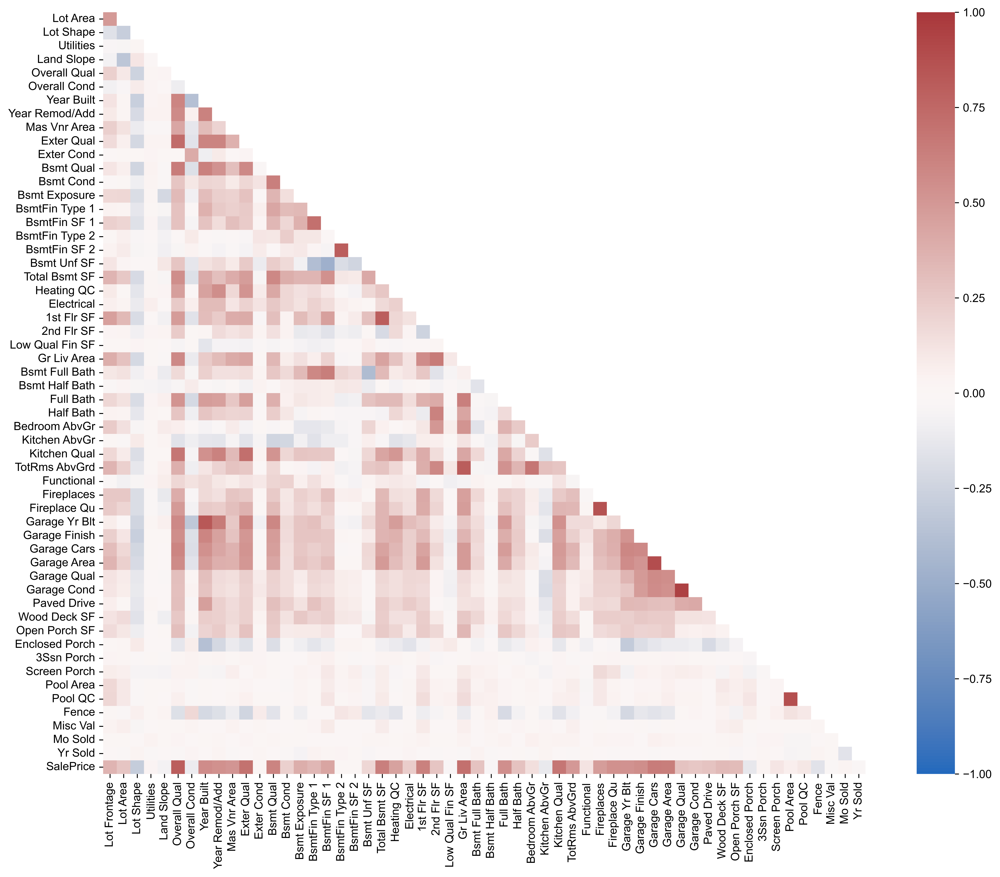

Multicollinear sets: 
['Pool QC', 'Pool Area']
['Gr Liv Area', 'TotRms AbvGrd']
['Fireplace Qu', 'Fireplaces']
['Garage Qual', 'Garage Cond']
['Year Built', 'Garage Yr Blt']
['1st Flr SF', 'Total Bsmt SF']
['Garage Area', 'Garage Cars']


In [14]:
corr = ames_encoded_df.select_dtypes("number").corr()

fig = plt.figure(figsize=(16, 12))

sns.heatmap(
    corr.iloc[1:, :-1],
    cmap="vlag",
    vmin=-1,
    vmax=1,
    mask=np.triu(np.ones(corr.shape[0] - 1), 1),
    square=True,
)

plt.show()

sets = set()

for c in corr.columns:
    curr_s = corr[c]
    curr_s = curr_s[curr_s >= 0.8].drop(c)

    if not curr_s.empty:
        sets.add(frozenset(curr_s.index.to_list() + [c]))

print("Multicollinear sets: ")

for s in sets:
    print(list(s))